Published on March 03, 2024. By Marília Prata, mpwolke

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
from matplotlib import pyplot as plt

from tqdm import tqdm
import matplotlib.pyplot as plt

import plotly.graph_objects as go
import plotly.offline as py
import plotly.express as px
from plotly.offline import iplot

#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/geolifeclef-2024/GLC24_PA_metadata_train.csv
/kaggle/input/geolifeclef-2024/GLC24_P0_metadata_train.csv
/kaggle/input/geolifeclef-2024/GLC24_SAMPLE_SUBMISSION.csv
/kaggle/input/geolifeclef-2024/GLC24_PA_metadata_test.csv
/kaggle/input/geolifeclef-2024/PA_Test_SatellitePatches_RGB/pa_test_patches_rgb/47/50/1465047.jpeg
/kaggle/input/geolifeclef-2024/PA_Test_SatellitePatches_RGB/pa_test_patches_rgb/47/61/2256147.jpeg
/kaggle/input/geolifeclef-2024/PA_Test_SatellitePatches_RGB/pa_test_patches_rgb/47/61/1836147.jpeg
/kaggle/input/geolifeclef-2024/PA_Test_SatellitePatches_RGB/pa_test_patches_rgb/47/05/1600547.jpeg
/kaggle/input/geolifeclef-2024/PA_Test_SatellitePatches_RGB/pa_test_patches_rgb/47/05/2270547.jpeg
/kaggle/input/geolifeclef-2024/PA_Test_SatellitePatches_RGB/pa_test_patches_rgb/47/60/536047.jpeg
/kaggle/input/geolifeclef-2024/PA_Test_SatellitePatches_RGB/pa_test_patches_rgb/47/27/1272747.jpeg
/kaggle/input/geolifeclef-2024/PA_Test_SatellitePatches_RGB/pa_test_patch

![](https://www.lirmm.fr/arith18/img/LIRMMlogo_complet.png)https://www.lirmm.fr/

#Merci à tous Organisateurs et Contributeurs:

Lukas Picek, INRIA, LIRMM, Montpellier

Christophe Botella, INRIA, LIRMM, Montpellier

Diego Marcos, INRIA , Montpellier

Théo Larcher, INRIA, LIRMM, Montpellier

Joachim Estopinan, INRIA, LIRMM, Montpellier

César Leblanc, INRIA, LIRMM, Montpellier

Maximilien Servajean, Université Paul Valéry, LIRMM, Montpellier

Alexis Joly, INRIA, LIRMM, Montpellier

https://www.kaggle.com/competitions/geolifeclef-2024/overview

#Started 12:54 till 13:14 to load the Dataset. The Climate Zip till 13:35  Upload on Kaggle 15:24

Notebook running for 3h:55m and the session failed to saved the draft : )

In [2]:
import os, sys, random, gc, math, glob, time, pathlib
import numpy as np
import pandas as pd
import io, timeit, os, gc, pickle, psutil
import warnings
import cv2
#import gdal
#import osgeo
import json
import rasterio
from rasterio.windows import Window

#I don't need the snippet below since I downloaded Climate Dataset on Seafile

https://lab.plantnet.org/seafile/d/bdb829337aa44a9489f6/

In [ ]:
!python download.py --data output --raster --presence-only --Climate

#Climate - EnvironmentalRasters

MONTHLY CLIMATIC RASTERS

"Four climatic variables computed monthly (mean, minimum and maximum temperature, and total precipitation) from January 2000 to December 2019, yielding 960 low-resolution rasters covering Europe."

"Format1: CSV files, one per raster referenced through the "surveyId".
Format2: TimeSeries-Cubes - Above mentioned CSV aggregated into 3d tensors with axis as YEAR, QUATER, RASTER-TYPE.
Resolution: ~1 kilometer
Source: Chelsa
Access: /EnvironmentalRasters/Climate/Climatic_Monthly_2000-2019
Environmental rasters
For each observation, we provide additional environmental data such as GeoTIFF rasters and scalar values already extracted from the rasters. We provide CSV files, one per band raster type, i.e., Climate, Elevation, Human Footprint, LandCover, and SoilGrids.

BIOCLIMATIC RASTERS:

19 low-resolution rasters covering Europe; commonly used in species distribution modeling. Provided in longitude/latitude coordinates (WGS84)."

Format: GeoTIFF files with compression and CSV file with extracted values.
Resolution: 30 arcsec (~ 1 kilometer)
Source: Landsat remote sensing data pre-processed by the Ecodatacube platform
Access: /EnvironmentalRasters/Climate/BioClimatic_Average_1981-2010

https://www.kaggle.com/competitions/geolifeclef-2024/data

In [55]:
import rasterio as rio
import folium
import tifffile as tiff

(5467, 8143)


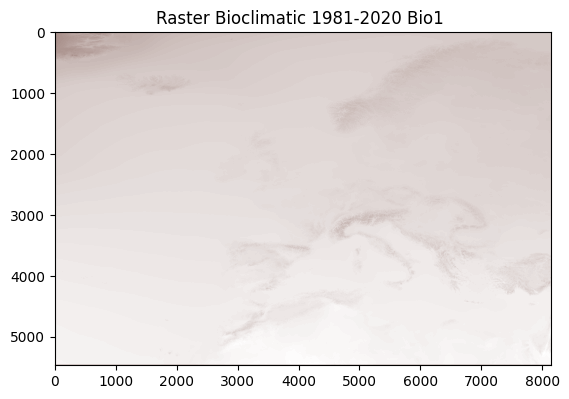

In [56]:
#Code by JyeSR https://www.kaggle.com/jyesawtellrickson/data-measurement-levels

from skimage.io import imread
image = imread('/kaggle/input/climateclef/Climate/BioClimatic_Average_1981-2010/bio1.tif')
print (image.shape)
plt.imshow(image[:,:], cmap = 'terrain')#it was [:,:,0]
plt.axes = False
plt.title("Raster Bioclimatic 1981-2020 Bio1 ");

(5467, 8143)


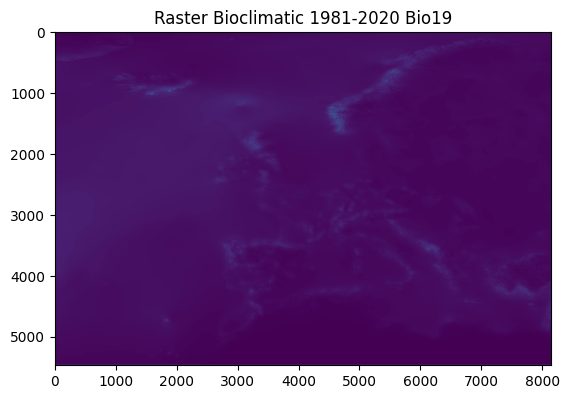

In [58]:
#Code by JyeSR https://www.kaggle.com/jyesawtellrickson/data-measurement-levels

from skimage.io import imread
image = imread('/kaggle/input/climateclef/Climate/BioClimatic_Average_1981-2010/bio19.tif')
print (image.shape)
plt.imshow(image[:,:], cmap = 'viridis')#it was [:,:,0]
plt.axes = False
plt.title("Raster Bioclimatic 1981-2020 Bio19");

(5467, 8143)


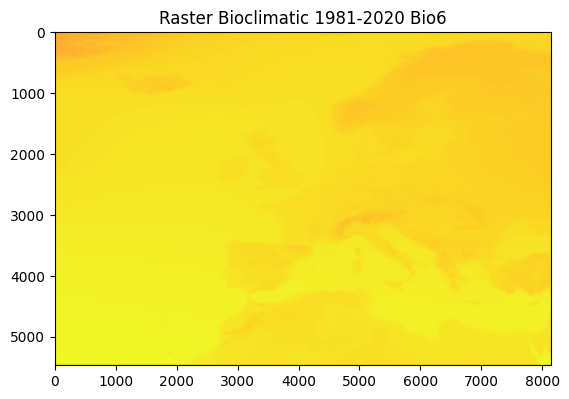

In [59]:
#Code by JyeSR https://www.kaggle.com/jyesawtellrickson/data-measurement-levels

from skimage.io import imread
image = imread('/kaggle/input/climateclef/Climate/BioClimatic_Average_1981-2010/bio6.tif')
print (image.shape)
plt.imshow(image[:,:], cmap = 'plasma')#it was [:,:,0]
plt.axes = False
plt.title("Raster Bioclimatic 1981-2020 Bio6");

(5467, 8143)


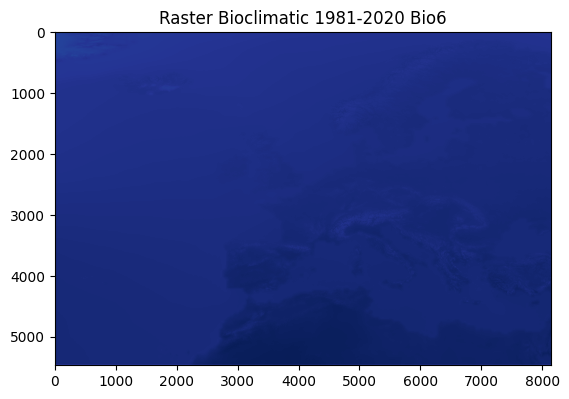

In [60]:
#Code by JyeSR https://www.kaggle.com/jyesawtellrickson/data-measurement-levels

from skimage.io import imread
image = imread('/kaggle/input/climateclef/Climate/BioClimatic_Average_1981-2010/bio5.tif')
print (image.shape)
plt.imshow(image[:,:], cmap = 'YlGnBu')#it was [:,:,0]
plt.axes = False
plt.title("Raster Bioclimatic 1981-2020 Bio6");

(5467, 8143)


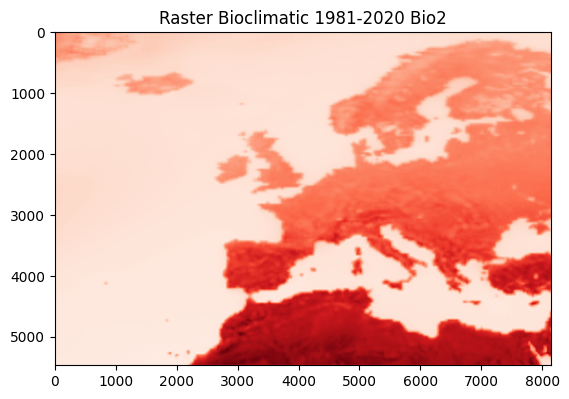

In [61]:
#Code by JyeSR https://www.kaggle.com/jyesawtellrickson/data-measurement-levels

from skimage.io import imread
image = imread('/kaggle/input/climateclef/Climate/BioClimatic_Average_1981-2010/bio2.tif')
print (image.shape)
plt.imshow(image[:,:], cmap = 'Reds')#it was [:,:,0]
plt.axes = False
plt.title("Raster Bioclimatic 1981-2020 Bio2");

(5467, 8143)


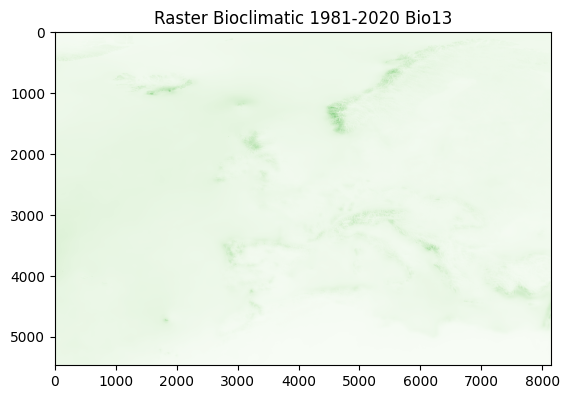

In [62]:
#Code by JyeSR https://www.kaggle.com/jyesawtellrickson/data-measurement-levels

from skimage.io import imread
image = imread('/kaggle/input/climateclef/Climate/BioClimatic_Average_1981-2010/bio13.tif')
print (image.shape)
plt.imshow(image[:,:], cmap = 'Greens')#it was [:,:,0]
plt.axes = False
plt.title("Raster Bioclimatic 1981-2020 Bio13");

#Unfortunately, I wasn't lucky to open a Climatic Montly 2000-2019. Many are empty.

(5467, 8143)


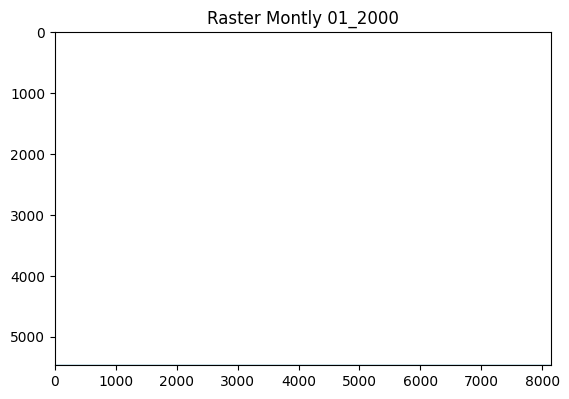

In [57]:
#Code by JyeSR https://www.kaggle.com/jyesawtellrickson/data-measurement-levels

from skimage.io import imread
image = imread('/kaggle/input/climateclef/Climate/Climatic_Monthly_2000-2019/01_2000_pr.tif')
print (image.shape)
plt.imshow(image[:,:], cmap = 'ocean') #it was [:,:,0] 3D
plt.axes = False
plt.title("Raster Montly 01_2000");

In [3]:
DATA_PATH = "../input/geolifeclef-2024/"

#Since everything is huge on this Competition, I'll open just one directory (from Train/RGB)

PA_Train_SatellitePatches_RGB (1 directory), pa_train_patches_rgb (100 directories), 00 (100 directories) and finally 04 (16 files)

In [4]:
image_paths = sorted(glob.glob(os.path.join(DATA_PATH, 'PA_Train_SatellitePatches_RGB/pa_train_patches_rgb/00/04/*.jpeg')))

In [5]:
print(f"Number of images: {len(image_paths)}")

Number of images: 16


In [6]:
#Code by Ihelon https://www.kaggle.com/code/ihelon/illustrations-kumapi390-eda

image_shapes = {}

for ind, image_path in enumerate(image_paths):
    image = cv2.imread(image_path)
    image_shapes[image.shape] = image_shapes.get(image.shape, 0) + 1
    
image_shapes

{(128, 128, 3): 16}

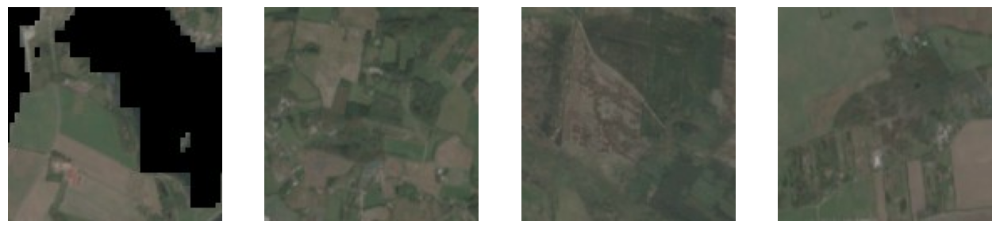

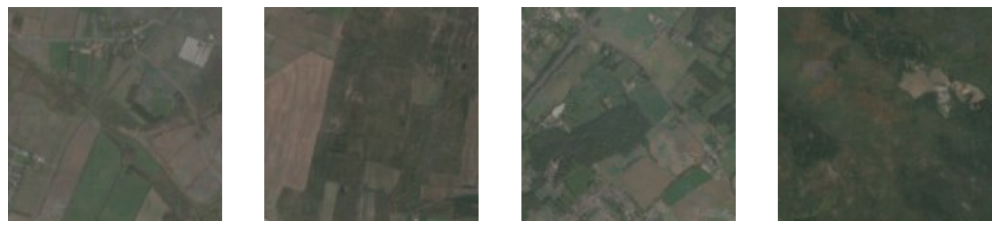

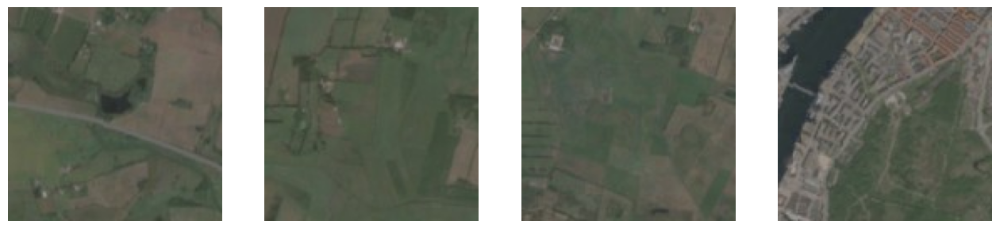

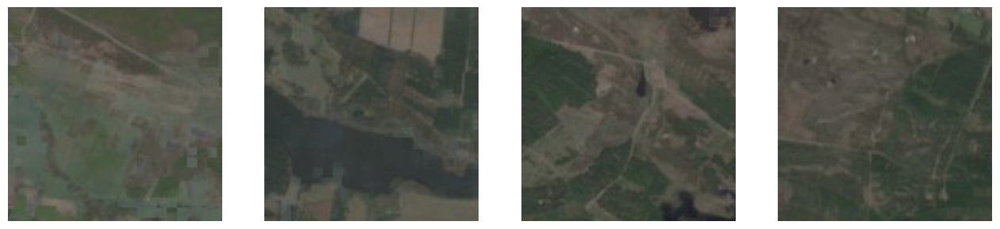

In [7]:
#Code by Ihelon https://www.kaggle.com/code/ihelon/illustrations-kumapi390-eda

n_cols = 4

for ind, image_path in enumerate(image_paths):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    if ind % n_cols == 0:
        plt.figure(figsize=(16, 5))
    plt.subplot(1, n_cols, ind % n_cols + 1)
    plt.imshow(image)
    plt.axis("off")
    if ind % n_cols == n_cols - 1:
        plt.show()

#The Huge Len of the file (88987)

In [34]:
image_paths2 = sorted(glob.glob(os.path.join(DATA_PATH, 'PA_Train_SatellitePatches_RGB/pa_train_patches_rgb/**/**/*.jpeg')))

In [35]:
print(f"Number of images: {len(image_paths2)}")

Number of images: 88987


#Let's check NIR

PA_Train_SatellitePatches_NIR(1 directories), pa_train_patches_nir(100 directories), 00(100 directories) and 04(16 files).

In [8]:
image_paths1 = sorted(glob.glob(os.path.join(DATA_PATH, 'PA_Train_SatellitePatches_NIR/pa_train_patches_nir/00/04/*.jpeg')))

In [9]:
#Code by Ihelon https://www.kaggle.com/code/ihelon/illustrations-kumapi390-eda

image_shapes = {}

for ind, image_path in enumerate(image_paths1):
    image = cv2.imread(image_path)
    image_shapes[image.shape] = image_shapes.get(image.shape, 0) + 1
    
image_shapes

{(128, 128, 3): 16}

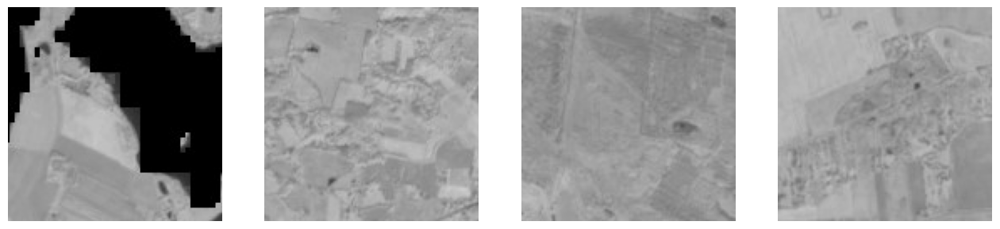

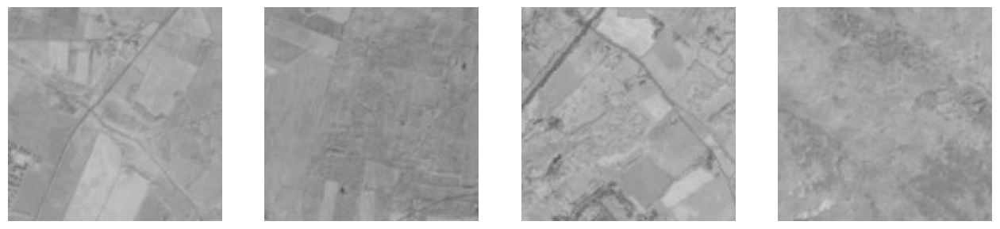

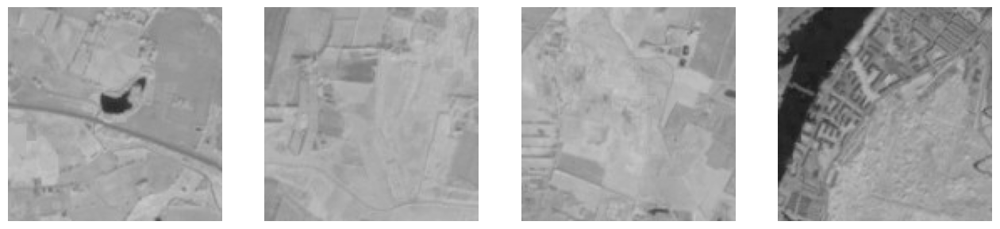

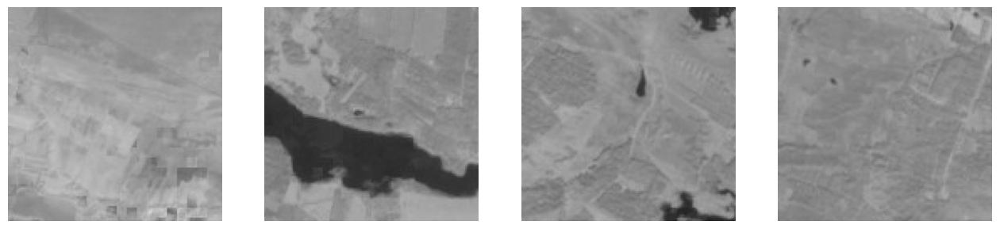

In [10]:
#Code by Ihelon https://www.kaggle.com/code/ihelon/illustrations-kumapi390-eda

n_cols = 4

for ind, image_path in enumerate(image_paths1):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    if ind % n_cols == 0:
        plt.figure(figsize=(16, 5))
    plt.subplot(1, n_cols, ind % n_cols + 1)
    plt.imshow(image)
    plt.axis("off")
    if ind % n_cols == n_cols - 1:
        plt.show()

#NIR files Len (88987)

In [36]:
image_paths3 = sorted(glob.glob(os.path.join(DATA_PATH, 'PA_Train_SatellitePatches_NIR/pa_train_patches_nir/**/**/*.jpeg')))

In [37]:
print(f"Number of images: {len(image_paths3)}")

Number of images: 88987


#Opening a Time Series-Cubes pt File. However, I've No clue about what to make with those Pt files.

In [12]:
#By StackOverflow https://stackoverflow.com/questions/71533654/open-and-read-pt-file-using-python-code-by-pytorch

import torch

# Load the file
pt_file = torch.load("../input/geolifeclef-2024/TimeSeries-Cubes/GLC24-PA-train-bioclimatic_monthly/GLC24-PA-train-bioclimatic_monthly_1000012_cube.pt")

# Print the head of the file
print(pt_file[:5])

tensor([[[ 5516.,  7292.,  6109.,  4611.,  4417.,  5272.,  3619.,  4989.,
           6509.,  9142.,  7476.,  6483.],
         [ 3953.,  5555.,  5015.,  5212.,  3873.,  5499.,  4719.,  8032.,
          13507.,  5318.,  5239.,  5681.],
         [ 9365., 11493.,  3722.,  3229.,  5224.,  9763., 12798.,  8180.,
           2068., 10789.,  9855.,  2503.],
         [ 5161.,   984.,  1771.,  4801.,  6697.,  8863.,  6443.,  5079.,
           3383.,  5488.,  4547.,  5949.],
         [10296.,  4284.,  5218.,  3964.,  3504.,  8171.,  6474., 12472.,
           7106., 11054.,  4923.,  7431.],
         [ 6675.,  5818.,  3914.,  4409.,  6688.,  4759., 12057.,  4481.,
           1736.,  6552.,  6581.,  5490.],
         [ 3467.,  4976.,  4050.,  5389.,  8615.,  2316.,  4075., 14867.,
           1928., 11782.,  6645., 10188.],
         [13131.,  8434.,  4601.,   482.,  7706., 14470., 13887.,  8145.,
           8615.,  3314.,  4968.,  7142.],
         [ 9085.,  6677.,  7959.,  4777.,  1327.,  2255.,  5185.

In [13]:
train = pd.read_csv("../input/geolifeclef-2024/GLC24_PA_metadata_train.csv", sep=",")

train.tail()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,speciesId,surveyId
1483632,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,53.0,3919655
1483633,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,5071.0,3919655
1483634,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,1889.0,3919655
1483635,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,10600.0,3919655
1483636,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,963.0,3919655


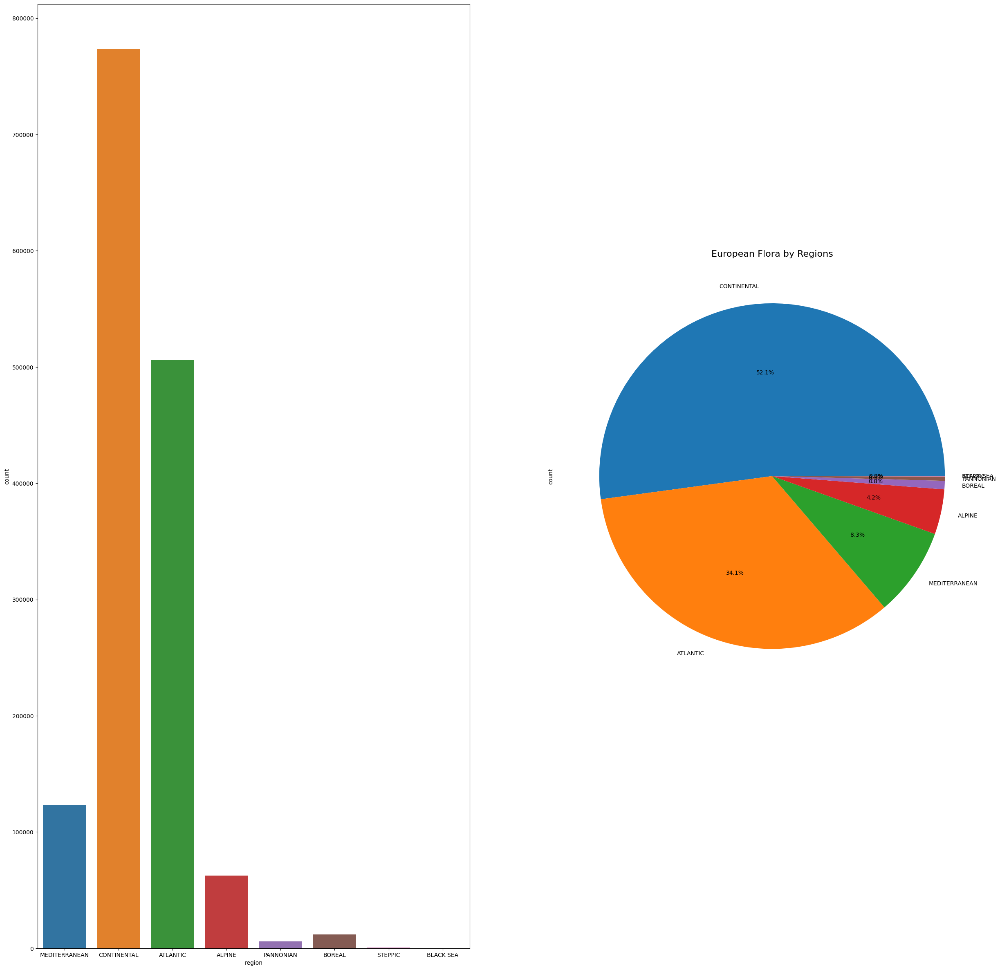

In [16]:
#Sınıflara ait örnek sayılarının grafikle gösterimi 
fig, ax=plt.subplots(1,2,figsize=(30,30))
plt.xticks(rotation=45, fontsize=12)
sns.countplot(x='region', data=train, ax=ax[0])
train['region'].value_counts().plot.pie(autopct="%1.1f%%", ax=ax[1])
plt.title('European Flora by Regions', fontsize=16);

In [17]:
import geopandas as gpd

In [18]:
geom = gpd.points_from_xy(x = train['lon'], y=train['lat'], crs=4326)
train_geo = gpd.GeoDataFrame(train, geometry=geom)

#On the previous Notebook I plotted 2 maps by Countries, now I'll try by regions: Alpine region.

In [19]:
train_geo_al = train_geo[train_geo['region']=='ALPINE']

#SpeciesId 254.0 (tff= two five four)

In [20]:
tff = train_geo_al[train_geo_al['speciesId']==254.0]
tff.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,speciesId,surveyId,geometry
23608,1.951045,42.526651,2018,0.0,16.0,ALPINE,France,254.0,65270,POINT (1.95104 42.52665)
29100,1.704190,42.855670,2019,1.0,NaN,ALPINE,France,254.0,80625,POINT (1.70419 42.85567)
57787,1.957972,42.743639,2018,10.0,25.0,ALPINE,France,254.0,155637,POINT (1.95797 42.74364)
65671,14.537471,47.962518,2017,50.0,25.0,ALPINE,Austria,254.0,176765,POINT (14.53747 47.96252)
68613,12.986800,47.757133,2017,50.0,25.0,ALPINE,Austria,254.0,183219,POINT (12.98680 47.75713)


#Which Countries have Alpine region (species 254.0)

In [22]:
tff["country"].value_counts()

country
Austria    41
France     21
Germany     3
Italy       1
Spain       1
Name: count, dtype: int64

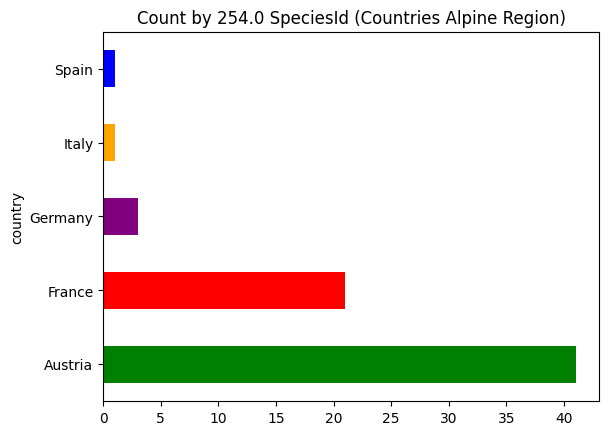

In [24]:
tff['country'].value_counts(dropna=False).plot(kind='barh', color=['green', 'red', 'purple', 'orange', 'blue'], title='Count by 254.0 SpeciesId (Countries Alpine Region)');

#Our Sample has 67 

In [31]:
country_params = dict(column="country", tooltip=True, popup=True, cmap=['green', 'red', 'purple', 'orange', 'blue'], marker_kwds=dict(radius=3.5, fill=True), style_kwds=dict(stroke=False))
tff.sample(60).explore(**country_params)

#Changing Region to Continental

In [27]:
train_geo_con = train_geo[train_geo['region']=='CONTINENTAL']

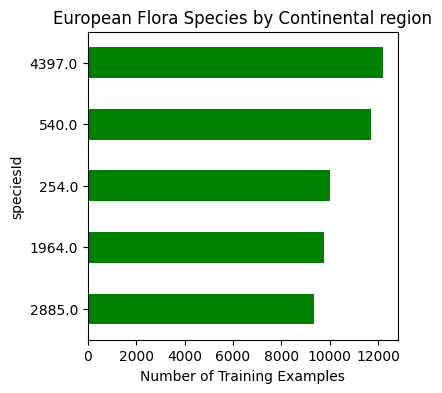

In [28]:
#By Rob Mulla https://www.kaggle.com/code/robikscube/sign-language-recognition-eda-twitch-stream

fig, ax = plt.subplots(figsize=(4, 4))
train_geo_con["speciesId"].value_counts().head().sort_values(ascending=True).plot(
    kind="barh", color='g', ax=ax, title="European Flora Species by Continental region"
)
ax.set_xlabel("Number of Training Examples")
plt.show()

#Above SpeciesId 4397.0 seems to have more occurences by Continental Region

In [29]:
ftns = train_geo_con[train_geo_con['speciesId']==4397.0]
ftns.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,speciesId,surveyId,geometry
459,9.637990,55.708310,2017,10.0,79.0,CONTINENTAL,Denmark,4397.0,1149,POINT (9.63799 55.70831)
489,15.725205,50.784923,2018,NaN,25.0,CONTINENTAL,Poland,4397.0,1191,POINT (15.72521 50.78492)
557,11.377610,55.968720,2018,10.0,79.0,CONTINENTAL,Denmark,4397.0,1573,POINT (11.37761 55.96872)
731,9.988220,56.356210,2017,10.0,79.0,CONTINENTAL,Denmark,4397.0,2106,POINT (9.98822 56.35621)
911,10.235180,57.125560,2020,10.0,79.0,CONTINENTAL,Denmark,4397.0,2673,POINT (10.23518 57.12556)


In [30]:
ftns["country"].value_counts()

country
Denmark                   11409
Poland                      330
Czech Republic              140
Germany                     121
Austria                      93
Slovakia                     35
Romania                      18
Serbia                       15
France                       12
Croatia                       9
Belgium                       8
Bosnia and Herzegovina        4
Norway                        3
Italy                         1
Slovenia                      1
Name: count, dtype: int64

In [33]:
country_params = dict(column="country", tooltip=True, popup=True, colormap='purple', marker_kwds=dict(radius=3.5, fill=True), style_kwds=dict(stroke=False))
ftns.sample(12000).explore(**country_params)

#Trying Boreal Region

In [38]:
train_geo_bo = train_geo[train_geo['region']=='BOREAL']

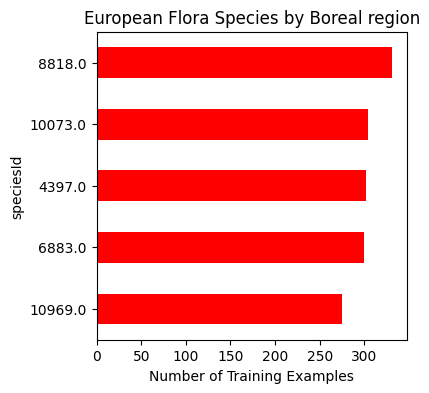

In [39]:
#By Rob Mulla https://www.kaggle.com/code/robikscube/sign-language-recognition-eda-twitch-stream

fig, ax = plt.subplots(figsize=(4, 4))
train_geo_bo["speciesId"].value_counts().head().sort_values(ascending=True).plot(
    kind="barh", color='r', ax=ax, title="European Flora Species by Boreal region"
)
ax.set_xlabel("Number of Training Examples")
plt.show()

#More 8818.0 SpeciesId

In [43]:
eeoe = train_geo_bo[train_geo_bo['speciesId']==8818.0]
eeoe.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,speciesId,surveyId,geometry
13265,26.915647,55.878814,2018,10.0,1.0,BOREAL,Latvia,8818.0,37096,POINT (26.91565 55.87881)
13277,26.915647,55.878814,2018,10.0,25.0,BOREAL,Latvia,8818.0,37096,POINT (26.91565 55.87881)
13287,26.915647,55.878814,2018,10.0,10.0,BOREAL,Latvia,8818.0,37096,POINT (26.91565 55.87881)
124277,26.105144,57.701235,2018,10.0,2.0,BOREAL,Latvia,8818.0,333368,POINT (26.10514 57.70123)
124310,26.105144,57.701235,2018,10.0,4.0,BOREAL,Latvia,8818.0,333368,POINT (26.10514 57.70123)


#Only Latvia has Boreal species 8818.0?

In [44]:
eeoe["country"].value_counts()

country
Latvia    331
Name: count, dtype: int64

#Sample size, check above

In [45]:
country_params = dict(column="country", tooltip=True, popup=True, colormap='purple', marker_kwds=dict(radius=3.5, fill=True), style_kwds=dict(stroke=False))
eeoe.sample(300).explore(**country_params)

#And The Climate zip (EnviromentalRasters) is STILL uploading on Kaggle! More than 2 hours!!!

Before, it took Forty minutes to download from Seafile.  I'm done after 3h:35m

Acknowledgements:

Ofir Mazor https://www.kaggle.com/code/ofirmazor/quick-maps-exploration-france

Rob Mulla https://www.kaggle.com/code/robikscube/sign-language-recognition-eda-twitch-stream